# Analyse background input tuning for iSPN

### First run the background input simulation on Dardel

On Dardel first run:

```
sbatch Dardel_run_input_tuning_background_ispn.job
```

Then copy over the networks/input_tuning_dspn directory to the corresponding location on your local machine.

In my case that is (all one very long line):

```
scp -pr dardel.pdc.kth.se:/cfs/klemming/home/h/hjorth/Snudda/examples/parallel/KTH_PDC/input_tuning/networks/input_tuning_ispn_background networks/
```

### Analyse the background simulation

In [1]:
import os
from snudda.input.input_tuning import InputTuning

network_path = os.path.join("networks", "input_tuning_ispn_background")
# BG_data = "../../../../../BasalGangliaData/data/"
BG_data = "/home/hjorth/HBP/2024-10-03/BasalGangliaData/data"
input_tuning = InputTuning(network_path, snudda_data=BG_data, input_seed_list=[10,20,30,40,50])

Loading networks/input_tuning_ispn_background/simulations/output-10.hdf5
WARNING. Depolarisation block in neuron - neuron_id: (name, parameter_key, morphology_key):
2809: (ispn_str_ispn_e_p1e9a2b16_m2d2108b6, p1e9a2b16, m2d2108b6)
2810: (ispn_str_ispn_e_p1e9a2b16_m2d2108b6, p1e9a2b16, m2d2108b6)
2811: (ispn_str_ispn_e_p1e9a2b16_m2d2108b6, p1e9a2b16, m2d2108b6)
2812: (ispn_str_ispn_e_p1e9a2b16_m2d2108b6, p1e9a2b16, m2d2108b6)
2813: (ispn_str_ispn_e_p1e9a2b16_m2d2108b6, p1e9a2b16, m2d2108b6)
2814: (ispn_str_ispn_e_p1e9a2b16_m2d2108b6, p1e9a2b16, m2d2108b6)
2815: (ispn_str_ispn_e_p1e9a2b16_m2d2108b6, p1e9a2b16, m2d2108b6)
2816: (ispn_str_ispn_e_p1e9a2b16_m2d2108b6, p1e9a2b16, m2d2108b6)
2817: (ispn_str_ispn_e_p1e9a2b16_m2d2108b6, p1e9a2b16, m2d2108b6)
2818: (ispn_str_ispn_e_p1e9a2b16_m2d2108b6, p1e9a2b16, m2d2108b6)
2819: (ispn_str_ispn_e_p1e9a2b16_m2d2108b6, p1e9a2b16, m2d2108b6)
2820: (ispn_str_ispn_e_p1e9a2b16_m2d2108b6, p1e9a2b16, m2d2108b6)
2831: (ispn_str_ispn_e_p1e9a2b16_m3fe14df8,

/home/hjorth/HBP/Snudda/snudda/input/input_tuning.py:532: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


Saving figure to networks/input_tuning_ispn_background/figures/m9c53b5c8-p2d6de3e9-ispn_str_ispn_e_p2d6de3e9_m9c53b5c8-background-inputs.png
Saving figure to networks/input_tuning_ispn_background/figures/mc1774f1f-p2d6de3e9-ispn_str_ispn_e_p2d6de3e9_mc1774f1f-background-inputs.png
Saving figure to networks/input_tuning_ispn_background/figures/mcd6a34f2-p2d6de3e9-ispn_str_ispn_e_p2d6de3e9_mcd6a34f2-background-inputs.png
Saving figure to networks/input_tuning_ispn_background/figures/mec72d113-p2d6de3e9-ispn_str_ispn_e_p2d6de3e9_mec72d113-background-inputs.png
Saving figure to networks/input_tuning_ispn_background/figures/m2c007bd0-p43820083-ispn_str_ispn_e_p43820083_m2c007bd0-background-inputs.png
Saving figure to networks/input_tuning_ispn_background/figures/m44c31740-p43820083-ispn_str_ispn_e_p43820083_m44c31740-background-inputs.png
Saving figure to networks/input_tuning_ispn_background/figures/m5a8196bf-p43820083-ispn_str_ispn_e_p43820083_m5a8196bf-background-inputs.png
Saving figure

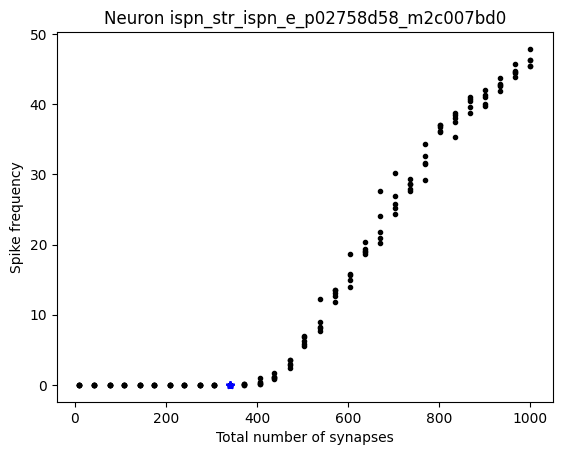

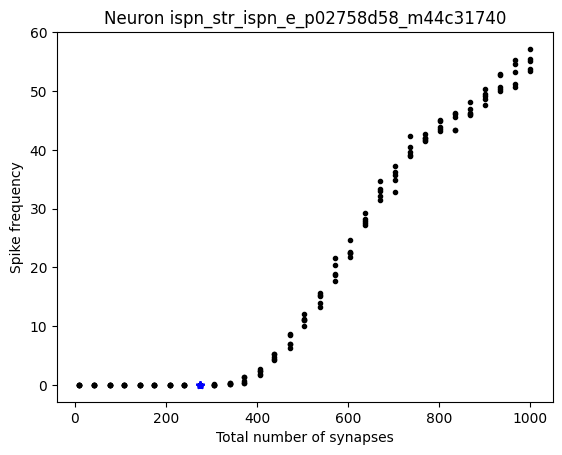

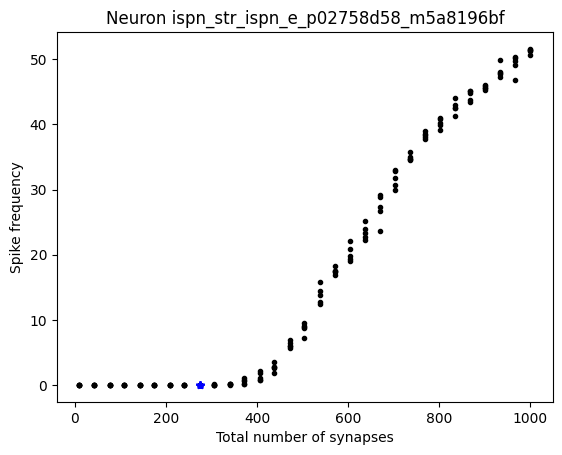

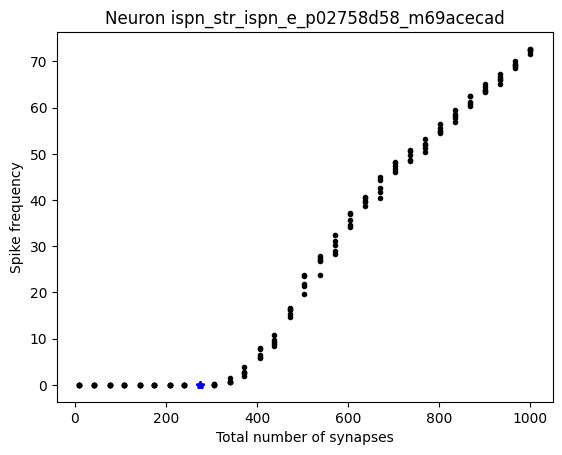

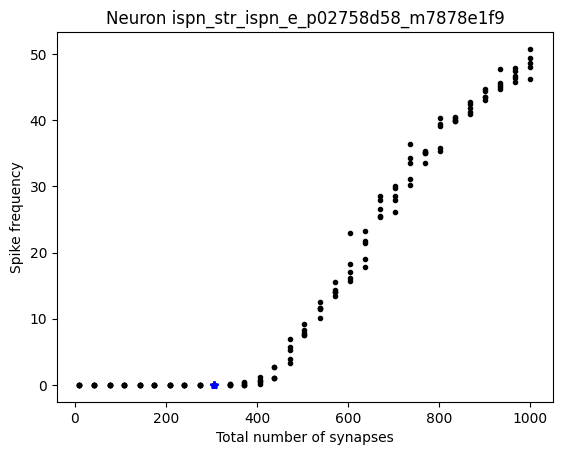

...

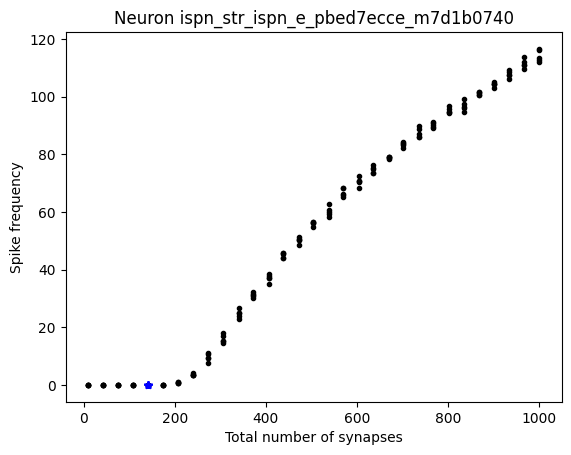

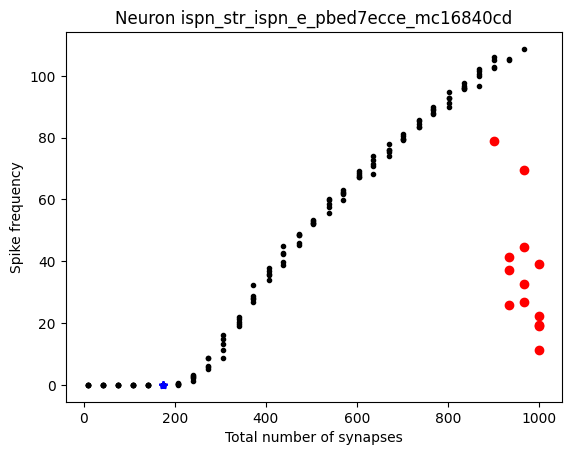

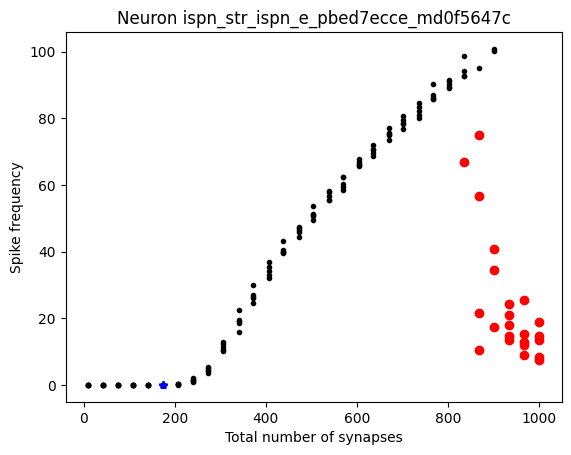

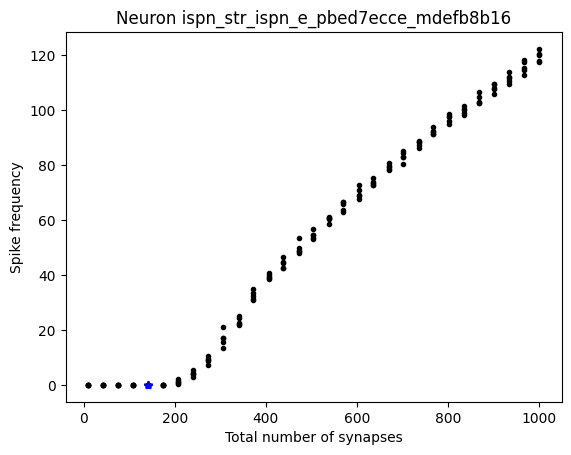

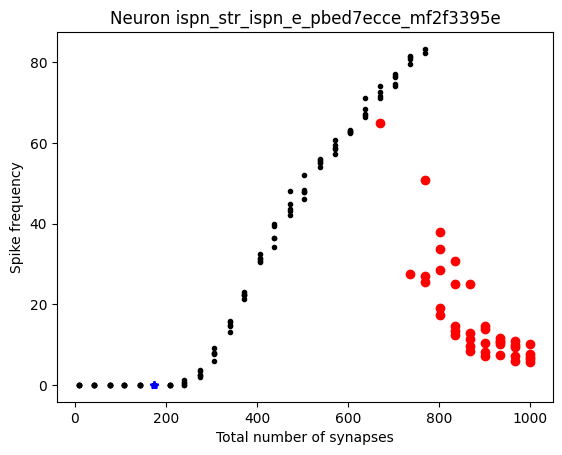

In [2]:
background_input = input_tuning.find_highest_non_spiking_background_input(show_plot=False)

### Update your SNUDDA_DATA with the new background input 

This updates the ```meta.json``` file for each of the neurons.

In [3]:
input_tuning.update_meta(background_input, overwrite=True)

Writing /home/hjorth/HBP/2024-10-03/BasalGangliaData/data/neurons/striatum/ispn/str-ispn-e150917_c11_D2-mWT-MSN1-v20220623/meta.json
Writing /home/hjorth/HBP/2024-10-03/BasalGangliaData/data/neurons/striatum/ispn/str-ispn-e151123_c1_D2-mWT-P270-09-v20220623-1/meta.json
Writing /home/hjorth/HBP/2024-10-03/BasalGangliaData/data/neurons/striatum/ispn/str-ispn-e160118_c10_D2-m46-3-DE-v20220622/meta.json
Writing /home/hjorth/HBP/2024-10-03/BasalGangliaData/data/neurons/striatum/ispn/str-ispn-e150908_c4_D2-m51-5-DE-v20220622/meta.json


### Run the input signal calibration on Dardel

```sbatch Dardel_run_input_tuning_cortical_signal_ispn.job ```

Then after the run finishes copy over the files to your local machine:

```
scp -pr dardel.pdc.kth.se:/cfs/klemming/home/h/hjorth/Snudda/examples/parallel/KTH_PDC/input_tuning/networks/input_tuning_ispn_cortical_signal networks/
```

### Find the optimal number of synapses for the signal

Here as a starting point we aim to have approximately 10Hz firing when there is 10Hz input frequency to the synapses.

In [ ]:
network_path = os.path.join("networks", "input_tuning_ispn_cortical_signal_10Hz")
input_tuning_cortical = InputTuning(network_path, snudda_data="../../../../../BasalGangliaData/data/", input_seed_list=[10,20,30,40,50])

In [ ]:
input_signal = input_tuning_cortical.find_signal_strength(requested_frequency=40.0, show_plot=False)

### Update the SNUDDA_DATA with the new cortical signal 

Important, we will set the signal frequency to 0Hz, so the user can update it themselves by overriding the frequency in the ```input.json``` file.

In [ ]:
input_tuning_cortical.update_meta(input_signal, overwrite=False, set_frequency=0.0)

## Run the thalamic input signal calibration on Dardel

```sbatch Dardel_run_input_tuning_thalamic_signal_ispn.job ```

Then after the run finishes copy over the files to your local machine:

```
scp -pr dardel.pdc.kth.se:/cfs/klemming/home/h/hjorth/Snudda/examples/parallel/KTH_PDC/input_tuning/networks/input_tuning_ispn_thalamic_signal networks/
```

### Find the optimal number of synapses for the signal

Here as a starting point we aim to have approximately 10Hz firing when there is 10Hz input frequency to the synapses.

In [ ]:
network_path = os.path.join("networks", "input_tuning_ispn_thalamic_signal_10Hz")
input_tuning_thalamic = InputTuning(network_path, snudda_data="../../../../../BasalGangliaData/data/", input_seed_list=[10,20,30,40,50])

In [ ]:
input_signal2 = input_tuning_thalamic.find_signal_strength(requested_frequency=40.0, show_plot=False)

### Update the SNUDDA_DATA with the new thalamic signal 

Important, we will set the signal frequency to 0Hz, so the user can update it themselves by overriding the frequency in the ```input.json``` file.

In [ ]:
input_tuning_thalamic.update_meta(input_signal2, overwrite=False, set_frequency=0.0)

## Bonus -- cortical contralateral input

In [ ]:
network_path = os.path.join("networks", "input_tuning_ispn_cortical_contralateral_signal_10Hz")
input_tuning_cortical_contralateral = InputTuning(network_path, snudda_data="../../../../../BasalGangliaData/data/", input_seed_list=[10,20,30,40,50])

In [ ]:
input_signal = input_tuning_cortical_contralateral.find_signal_strength(requested_frequency=40.0, show_plot=False)

In [ ]:
input_tuning_cortical_contralateral.update_meta(input_signal, overwrite=False, set_frequency=0.0)

## Bonus #2 -- clustered input

In [ ]:
network_path = os.path.join("networks", "input_tuning_ispn_cortical-clustered_signal_10Hz")
input_tuning_cortical_clustered = InputTuning(network_path, snudda_data="../../../../../BasalGangliaData/data/", input_seed_list=[10,20,30,40,50])

In [ ]:
input_signal = input_tuning_cortical_clustered.find_signal_strength(requested_frequency=40.0, show_plot=False)

In [ ]:
input_tuning_cortical_clustered.update_meta(input_signal, overwrite=False, set_frequency=0.0)

## Bonus #3 -- correlated input

In [ ]:
network_path = os.path.join("networks", "input_tuning_ispn_cortical-correlated_signal_10Hz")
input_tuning_cortical_correlated = InputTuning(network_path, snudda_data="../../../../../BasalGangliaData/data/", input_seed_list=[10,20,30,40,50])

In [ ]:
input_signal = input_tuning_cortical_correlated.find_signal_strength(requested_frequency=40.0, show_plot=False)

In [ ]:
input_tuning_cortical_correlated.update_meta(input_signal, overwrite=False, set_frequency=0.0)